# Chapter 3: Image Segmentation

## Problems

1. Graylevel abd **Bitplane** slicing    
    1.1 Gray level (Intensity level) slicing       
    1.2 Using gray-level slicing to Increase contrast within ROI        
    1.3 **Bitplane** slicing        
2. **Binarizing** an image with thresholding    
   2.1 **Thresholding** with `scikit-image`       
       2.1.1 **Global** Thresholding       
       2.1.2 **Local** Thresholding                  
   2.2 **Max-Entropy** Thresholding with `SimpleITK`       
   2.3 **Adaptive** Thresholding with `opencv-python`
3. **Segmentation** using clustering     
   3.1 **clustering** with **Mahalanobis** distance       
   3.2 **K-means** vs. **Spectral Clustering** with `scikit-image`       
4. **Meanshift** Segmentation    
   4.1 **MeanShift** Filtering with `opencv-python`       
   4.2 Segmentation with Mean-shift clustering in Lab space with `scikit-learn`    
5. **Watershed** Segmentation    
   5.1 **Watershed** with `opencv-python`       
   5.2 **Morphological Watershed** with `SimpleITK`       
6. **GrabCut** Segmentation with `opencv-python`
7. **RandomWalk** Segmentation with `scikit-image`
8. **Fast Marching** image segmentation with `SimpleITK`
9. Segmentation using **SLIC** and **Normalized Cut** Algorithms with `scikit-image`    
   9.1 **SLIC** Segmentation       
   9.2 with **Normalized Cut** (**NCut**)       
   9.3 with **RAG Merging**       

## Problem 1: Gray level and Bitplane slicing         

### 1.1 Gray level (Intensity level) slicing  

In [1]:
# %matplotlib inline
from skimage.io import imread
from skimage.color import rgb2gray
import numpy as np
import matplotlib.pylab as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
def gray_level_slice(im, min_pixel, max_pixel, with_background=False):
    im_sliced = im.copy()
    im_mask = (im >= min_pixel) & (im <= max_pixel)
    im_sliced[im_mask] = 255
    if not with_background:
        im_sliced[~im_mask] = 0
    return im_sliced, im_mask

def plot_images(ims, titles, suptitle = None):
    n = len(ims)
    plt.figure(figsize=(15,7))
    plt.gray()
    plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
    for i in range(n):
        plt.subplot(1,n,i+1), plt.imshow(ims[i]), plt.axis('off'), plt.title(titles[i], size=20)
    if suptitle:
        plt.suptitle(suptitle, size=25)
    plt.show()

* Now, let's first  read the image `coins.png`.
* use image gray level histogram to identify the range of grey levels within the coins.
* as can be seen from the following figure, most pixels are between $100$ and $240$.

In [ ]:
im = rgb2gray(imread('images/coins.png'))
#im = rgb2gray(imread('images/med.png'))
im = (255 * im / im.max()).astype(np.uint8)

plt.figure(figsize=(5,3))
plt.hist(im.flatten(), bins=100), plt.grid()
plt.title('hisogram of gray levels', size=20)
plt.show()

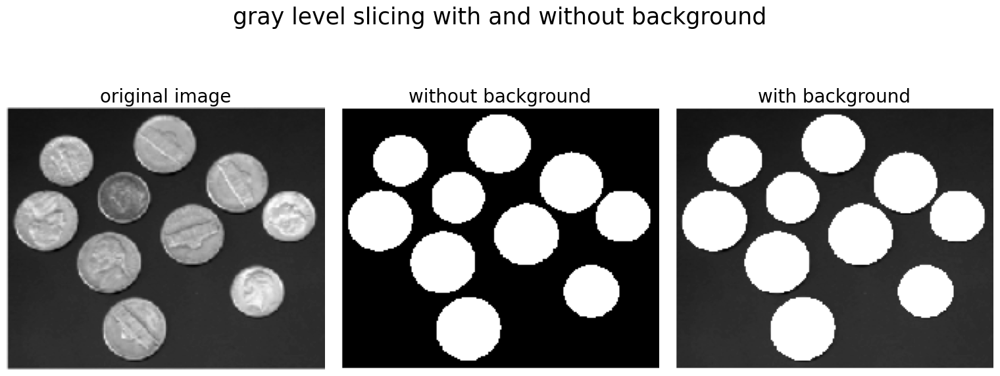

In [74]:
min_pixel, max_pixel = 90, 255
#min_pixel, max_pixel = 180, 255
# to improve use median filter on the background only to remove light grey pixels
# initialise your output images
im_sliced_without_bg, im_mask = gray_level_slice(im, min_pixel, max_pixel)
im_sliced_with_bg, im_mask = gray_level_slice(im, min_pixel, max_pixel, True)

plot_images([im, im_sliced_without_bg, im_sliced_with_bg], 
                 ['original image', 'without background', 'with background'], 
                 suptitle = 'gray level slicing with and without background')

### 1.2 Using gray-level slicing to Increase contrast within ROI 

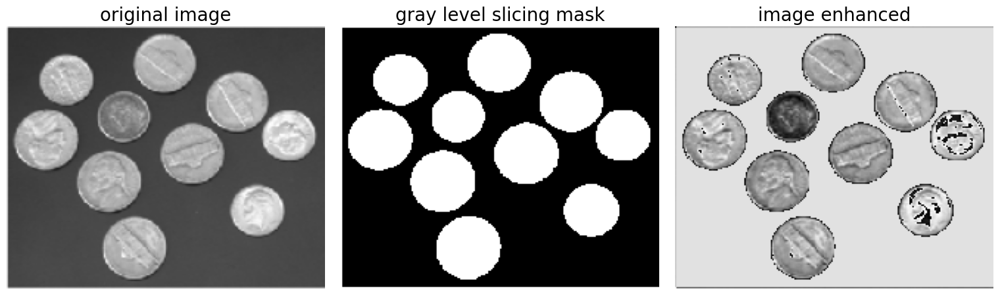

In [49]:
def enhance_image(im, im_mask, min_pixel):
    im_enhanced = 0 * im
    im_enhanced[im_mask] = np.round((im[im_mask] - min_pixel) * 1.8) # could be any transform
    im_enhanced[~im_mask] = 225 # could be any value or another transform
    return im_enhanced
    
im_enhanced = enhance_image(im, im_mask, min_pixel)
plot_images([im, im_sliced_without_bg, im_enhanced], 
                 ['original image', 'gray level slicing mask', 'image enhanced'])

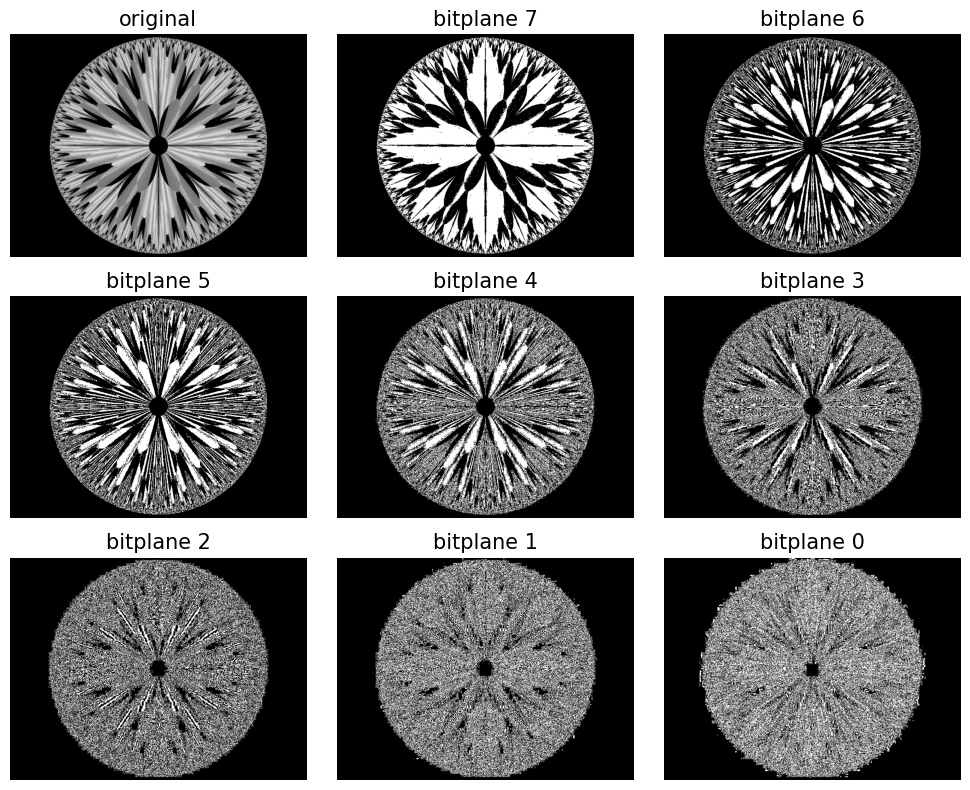

In [8]:
im = (255*rgb2gray(imread('images/Img_03_01.jpg'))).astype(np.uint8)
h, w = im.shape
bitplanes = np.unpackbits([im.flatten()], axis=0)
#bitplanes.shape

plt.figure(figsize=(10,8))
plt.subplots_adjust(0,0,1,0.95,0.05,0.09)
plt.gray()
plt.subplot(3,3,1), plt.imshow(im), plt.axis('off'), plt.title('original', size=15)
for i in range(8):
    plt.subplot(3,3,i+2)
    plt.imshow(bitplanes[i,:].reshape(h,w)), plt.axis('off'), plt.title('bitplane {}'.format(8-i-1), size=15)
plt.tight_layout()
plt.show()

## Problem 2: Binarizing an image with thresholding



### 2.1 Thresholding with `scikit-image`

### 2.1.1 Global thresholding

In [2]:
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pylab as plt
from skimage.filters import try_all_threshold, threshold_otsu, rank

In [ ]:
img = rgb2gray(imread('images/Img_03_02.jpg'))
img = (255* img / img.max()).astype(np.uint8)

# Here, we specify a radius for local thresholding algorithms.
# If it is not specified, only global algorithms are called.
fig, ax = try_all_threshold(img, figsize=(12, 18), verbose=False)
for a in ax: a.title.set_size(20)      
plt.show()

### 2.1.2 Local thresholding

In [36]:
from skimage.morphology import disk

def add_mult_noise(img):
    ramp = np.clip(np.tile(np.linspace(0, 1, img.shape[1]),(img.shape[0],1)), 0, 255)
    return (img * ramp).astype(np.uint8)

noisy_img = add_mult_noise(img)

In [ ]:
radius = 30
footprint = disk(radius)
local_thresh = rank.otsu(noisy_img, footprint)
local_otsu = noisy_img > local_thresh

global_thresh = threshold_otsu(noisy_img)
print(global_thresh)
global_otsu = noisy_img > global_thresh

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
ax = axes.ravel()

ax[0].imshow(noisy_img, cmap=plt.cm.gray, aspect='auto'), ax[0].set_title('input', size=20), ax[0].axis('off')
ax[1].imshow(local_otsu, cmap=plt.cm.gray, aspect='auto'), ax[1].set_title('local Otsu', size=20), ax[1].axis('off')
ax[2].hist(noisy_img.ravel(), bins=256), ax[2].set_title('Histogram', size=20), ax[2].axvline(global_thresh, color='r')
ax[3].imshow(global_otsu, cmap=plt.cm.gray, aspect='auto'), ax[3].set_title('global Otsu', size=20), ax[3].axis('off')

plt.tight_layout()
plt.show()

### 2.2 Max-Entropy Thresholding with `SimpleITK`

In [ ]:
import SimpleITK as sitk

input_image = sitk.ReadImage('images/Img_03_02.jpg', sitk.sitkFloat32)
rescale = sitk.RescaleIntensityImageFilter()
rescale.SetOutputMaximum(1.0)
input_image = rescale.Execute(input_image)

filter = sitk.MaximumEntropyThresholdImageFilter()
filter.SetOutsideValue(1)
filter.SetInsideValue(0)
output_image = filter.Execute(input_image)
print(filter.GetThreshold())

plt.figure(figsize=(20,15))
plt.gray()
plt.subplot(121), plt.imshow(sitk.GetArrayFromImage(input_image)), plt.axis('off'), plt.title('input', size=20)
plt.subplot(122), plt.imshow(sitk.GetArrayFromImage(output_image)), plt.axis('off'), plt.title('thresholded', size=20)
plt.tight_layout()
plt.show()

### 2.3 Adaptive Thresholding with `opencv-python`

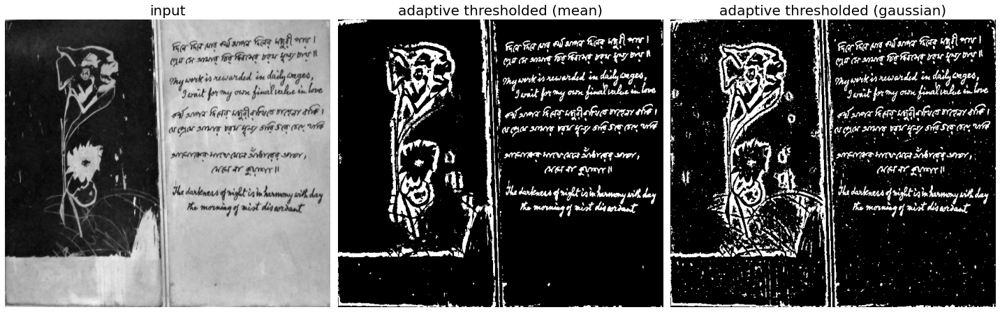

In [9]:
import cv2
import numpy as np
import matplotlib.pylab as plt

im = cv2.imread('images/Img_03_02.jpg', 0) 
#im = cv2.GaussianBlur(im, (7, 7), 0)
thresh1 = cv2.adaptiveThreshold(im, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 21, 10)
thresh2 = cv2.adaptiveThreshold(im, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 21, 4)

plt.figure(figsize=(20,12))
plt.gray()
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('input', size=20)
plt.subplot(132), plt.imshow(thresh1), plt.axis('off'), plt.title('adaptive thresholded (mean)', size=20)
plt.subplot(133), plt.imshow(thresh2), plt.axis('off'), plt.title('adaptive thresholded (gaussian)', size=20)
plt.tight_layout()
plt.show()

## Probelm 3: Segmentation using clustering

### 3.1 Clustering with Mahalanobis distance

In [9]:
import numpy as np
import scipy
from skimage.io import imread
from skimage.util import crop
import matplotlib.pylab as plt
cdist = scipy.spatial.distance.cdist

In [10]:
def mahalanobis(y, x):
    cov_x_inv = np.linalg.inv(np.cov(x,rowvar=False))
    return cdist(y, np.reshape(np.mean(x, axis=0), (1, -1)), 'mahalanobis', VI=cov_x_inv)

def compute_mahalanobis(I, S):    
    R, G, B = I[:,:,0], I[:,:,1], I[:,:,2] #color components
    subset_R, subset_G, subset_B = S[:,:,0], S[:,:,1], S[:,:,2]
    x = np.hstack((subset_R.reshape(-1,1), subset_G.reshape(-1,1), subset_B.reshape(-1,1)))
    y = np.hstack((R.reshape(-1,1), G.reshape(-1,1), B.reshape(-1,1)))
    return mahalanobis(y, x).ravel()

def cluster_rgb_mahalanobis(im, cluster_sample_locs):    
    mahal_dist  = np.zeros((np.prod(im.shape[:2]), len(cluster_sample_locs)))
    for i in range(len(cluster_sample_locs)):
        im_patch = crop(im, cluster_sample_locs[i], copy=False) #  # ((row_start, row_end), (col_start, col_end)) and (0,0) for the color channel
        mahal_dist[:,i] = compute_mahalanobis(im, im_patch)
    ind = np.argmin(mahal_dist, axis=1)
    ind = ind.reshape(im.shape[:2])
    mask = np.zeros(im.shape[:2])
    for k in range(mahal_dist.shape[1]):
        mask[ind == k] = k
    return mask

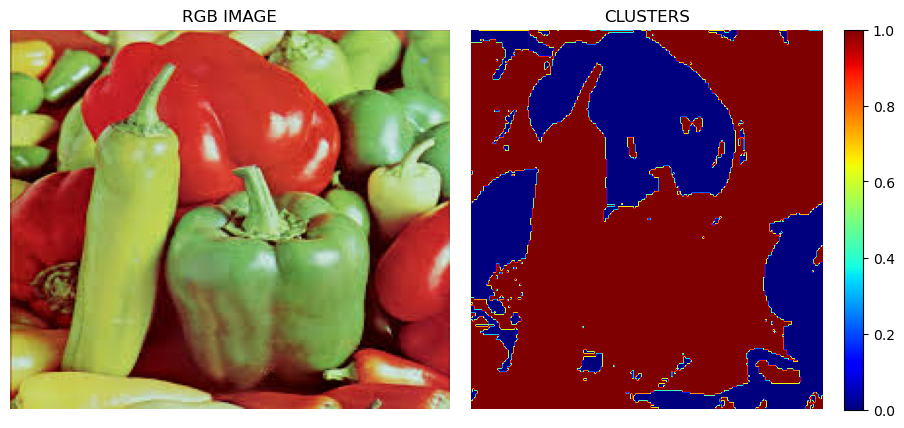

In [11]:
cluster_sample_locs = [
                         ((36, 150), (115, 90), (0,0)),
                         ((127, 70), (143, 60), (0,0))
                      ]

im = imread('images/Img_03_15.png')
mask = cluster_rgb_mahalanobis(im, cluster_sample_locs)

plt.figure(figsize=(9,4)) 
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
plt.subplot(121), plt.imshow(im, aspect='auto'), plt.title('RGB IMAGE'), plt.axis('off')
plt.subplot(122), plt.imshow(mask, cmap='jet', aspect='auto'), plt.colorbar(), plt.title('CLUSTERS'), plt.axis('off')
plt.show()

Now, display the segments separately, as shown in the following figure (left as an exercise to the reader).

![](images/pepper_mahal.png)

### 3.2 K-means vs. Spectral Clustering

In [4]:
from sklearn import cluster
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import resize as imresize
from sklearn.utils import shuffle
from sklearn.feature_extraction import img_to_graph
import numpy as np
import matplotlib.pylab as plt
import warnings
warnings.filterwarnings('ignore')

In [13]:
im = imread('images/Img_03_22.png')[...,:3]

X = np.reshape(im, (-1, im.shape[-1]))
X_sample = shuffle(X, random_state=0)[:1000]

k = 2
kmeans = cluster.KMeans(n_clusters=k, random_state=10)
kmeans.fit(X_sample)
y_pred = kmeans.predict(X).astype(np.uint8)
labels_kmeans = np.reshape(y_pred, im.shape[:2])

In [10]:
h, w, _ = im.shape
#print(h, w)
im_small = imresize(im, (h//4, w//4))
X = np.reshape(im_small, (-1, im.shape[-1]))
spectral = cluster.SpectralClustering(n_clusters=k, eigen_solver='arpack', 
                                      affinity="nearest_neighbors", n_neighbors=25, 
                                      assign_labels = 'discretize',
                                      random_state=10)
y_pred = spectral.fit_predict(X).astype(np.uint8)
labels_spectral = np.reshape(y_pred, im_small.shape[:2])

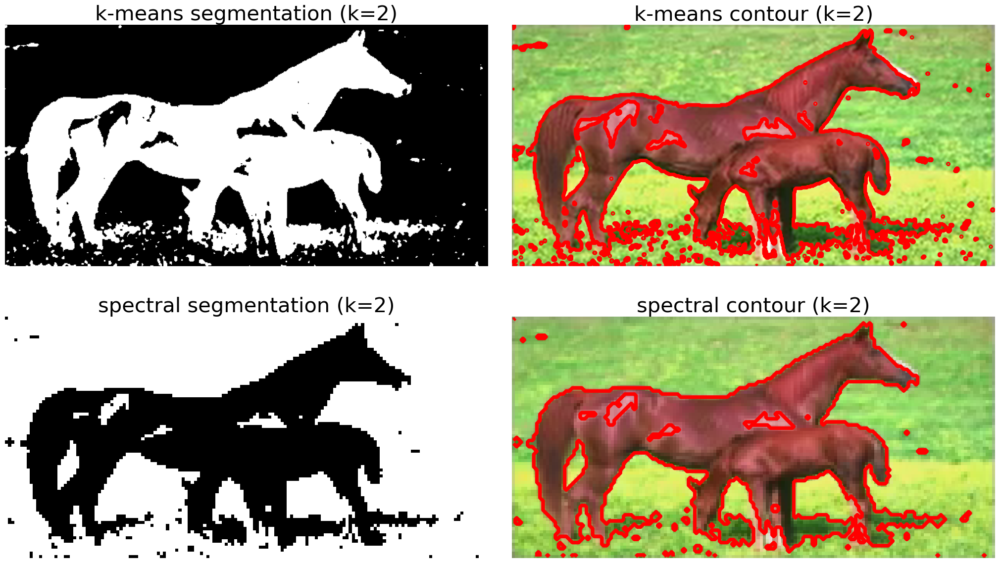

In [14]:
plt.figure(figsize=(20,12))
plt.gray()
plt.subplots_adjust(0,0,1,0.96,0.05,0.05)
plt.subplot(221), plt.imshow(labels_kmeans), plt.title('k-means segmentation (k=2)', size=30), plt.axis('off')
plt.subplot(222), plt.imshow(im.copy()), plt.axis('off')
for l in range(k):
    plt.contour(labels_kmeans == l, colors='r', linewidths=5)
plt.title('k-means contour (k=2)', size=30)
plt.subplot(223), plt.imshow(labels_spectral), plt.title('spectral segmentation (k=2)', size=30), plt.axis('off')
plt.subplot(224), plt.imshow(im_small.copy()), plt.axis('off')
for l in range(k):
    plt.contour(labels_spectral == l, colors='r', linewidths=5)
plt.title('spectral contour (k=2)', size=30)
plt.show()

### Problem 4: Meanshift Segmentation

### 4.1 MeanShift Filtering with `opencv-python`

In [12]:
import cv2
import numpy as np
import matplotlib.pylab as plt

image = cv2.imread('images/Img_03_03.jpg')
original = np.copy(image)
shifted = cv2.pyrMeanShiftFiltering(image, 20, 50)

In [9]:
gray = cv2.cvtColor(shifted, cv2.COLOR_BGR2GRAY)
thresh = np.invert(cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1])
cnts, _ = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
print("[INFO] {} unique contours found".format(len(cnts)))
 
for (i, c) in enumerate(cnts):
    ((x, y), _) = cv2.minEnclosingCircle(c)
    cv2.putText(image, "#{}".format(i + 1), (int(x) - 10, int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    cv2.drawContours(image, [c], -1, (0, 255, 0), 2)

[INFO] 2 unique contours found


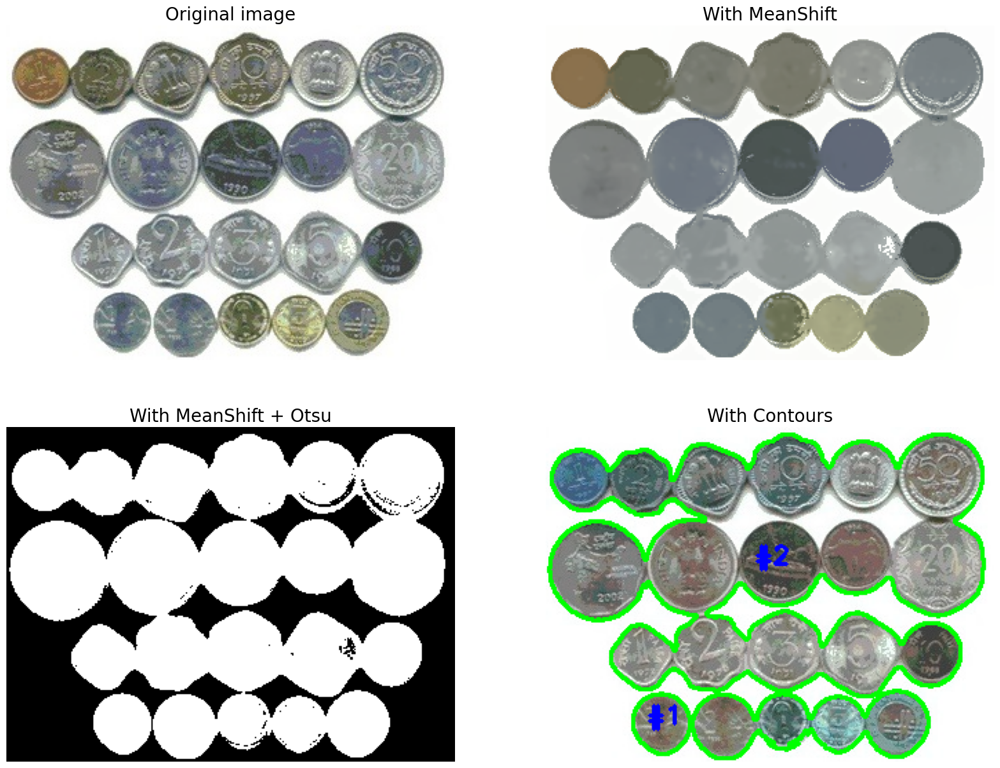

In [7]:
plt.figure(figsize=(20,15))
plt.subplot(221), plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Original image', size=20)
plt.subplot(222), plt.imshow(cv2.cvtColor(shifted, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('With MeanShift', size=20)
plt.subplot(223), plt.imshow(thresh, cmap='gray'), plt.axis('off'), plt.title('With MeanShift + Otsu', size=20)
plt.subplot(224), plt.imshow(image), plt.axis('off'), plt.title('With Contours', size=20)
plt.show()

### 4.2 Segmentation with Mean-shift clustering in Lab space with `scikit-learn`

4


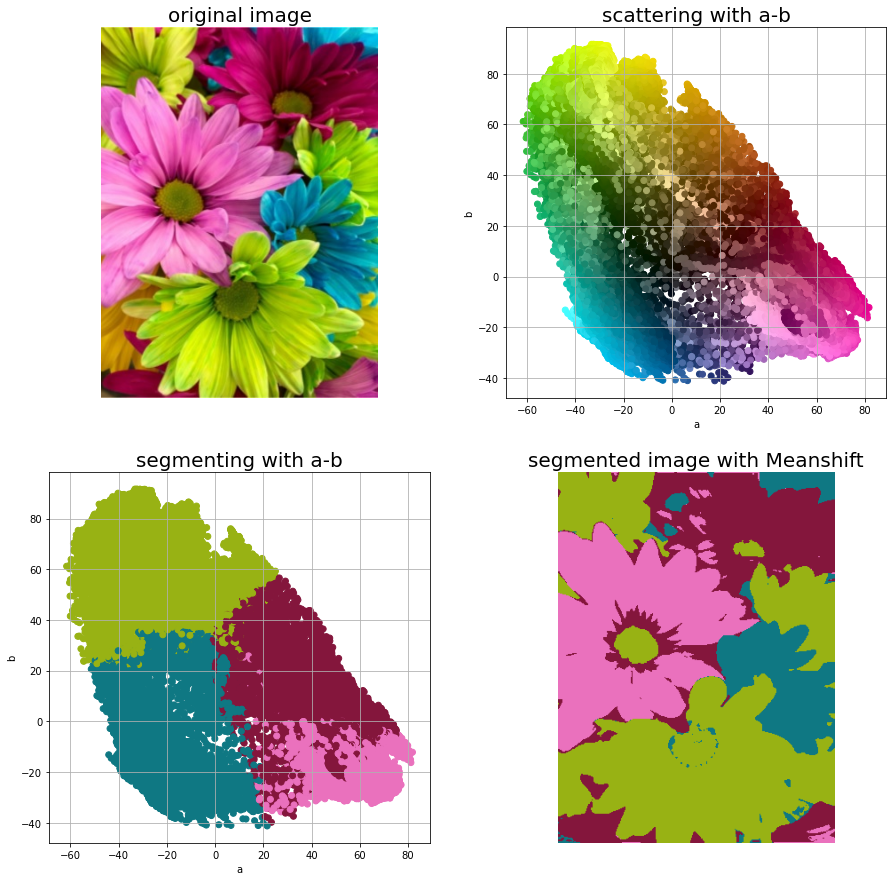

In [3]:
import numpy as np
from sklearn.cluster import MeanShift, estimate_bandwidth
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2lab, label2rgb

image = imread('images/Img_03_04.jpg') #pepper
flattened_image = np.reshape(rgb2lab(image), [-1, 3])
 
# estimate bandwidth
bandwidth = estimate_bandwidth(flattened_image[:, 1:], quantile=.2, n_samples=5000)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(flattened_image)
labels = ms.labels_
print(len(np.unique(labels)))
# 7

labels2 = np.reshape(labels, image.shape[:2])
plt.figure(figsize=(15,15))
plt.subplot(221), plt.imshow(image), plt.axis('off'), plt.title('original image', size=20)
plt.subplot(222), plt.scatter(flattened_image[:,1],flattened_image[:,2], color=np.reshape(image, [-1, 3])/255), plt.xlabel('a'), plt.ylabel('b'), plt.grid(), plt.title('scattering with a-b', size=20)
plt.subplot(223), plt.scatter(flattened_image[:,1],flattened_image[:,2], color=np.reshape(label2rgb(labels2, image, kind='avg'), [-1,3])/255, cmap='jet'), plt.xlabel('a'), plt.ylabel('b'), plt.grid(), plt.title('segmenting with a-b', size=20)
plt.subplot(224), plt.imshow(label2rgb(labels2, image, kind='avg')), plt.axis('off'), plt.title('segmented image with Meanshift', size=20)
plt.show()

### Problem 5: Watershed Segmentation

### 5.1 Watershed with `opencv-python`

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [82]:
def run_watershed(image):
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # threshold to obtain binary image
    ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

    # noise removal
    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 1)
    # sure background area
    sure_bg = cv2.dilate(opening,kernel,iterations=3)
    # Finding sure foreground area
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform,0.0001*dist_transform.max(),255,0)
    # Finding unknown region
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg,sure_fg)

    # Marker labelling
    ret, markers = cv2.connectedComponents(sure_fg)
    # Add one to all labels so that sure background is not 0, but 1
    markers = markers+1
    # Now, mark the region of unknown with zero
    markers[unknown==255] = 0

    markers = cv2.watershed(image,markers)
    image[markers == -1] = [255,0,0]

    # loop over the unique labels returned by the Watershed algorithm
    for label in np.unique(markers):
        # if the label is zero, we are examining the 'background', so simply ignore it
        if label == 0:
            continue

        # otherwise, allocate memory for the label region and draw, it on the mask
        mask = np.zeros(gray.shape, dtype="uint8")
        mask[markers == label] = 255

        # detect contours in the mask and grab the largest one
        contours, hierarchy = cv2.findContours(mask.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        for i in range(len(contours)):
            # Check if the contour has a parent (not the outermost contour)
            if hierarchy[0][i][3] != -1:
                color = (0, 255, 0)  # Green color
                cv2.drawContours(image, contours, i, color, 2, cv2.LINE_8, hierarchy, 0)  
                
    return dist_transform, markers, image
                
# Load the image
image = cv2.imread('images/Img_03_03.jpg')
original = image.copy()
dist_transform, markers, image = run_watershed(image)

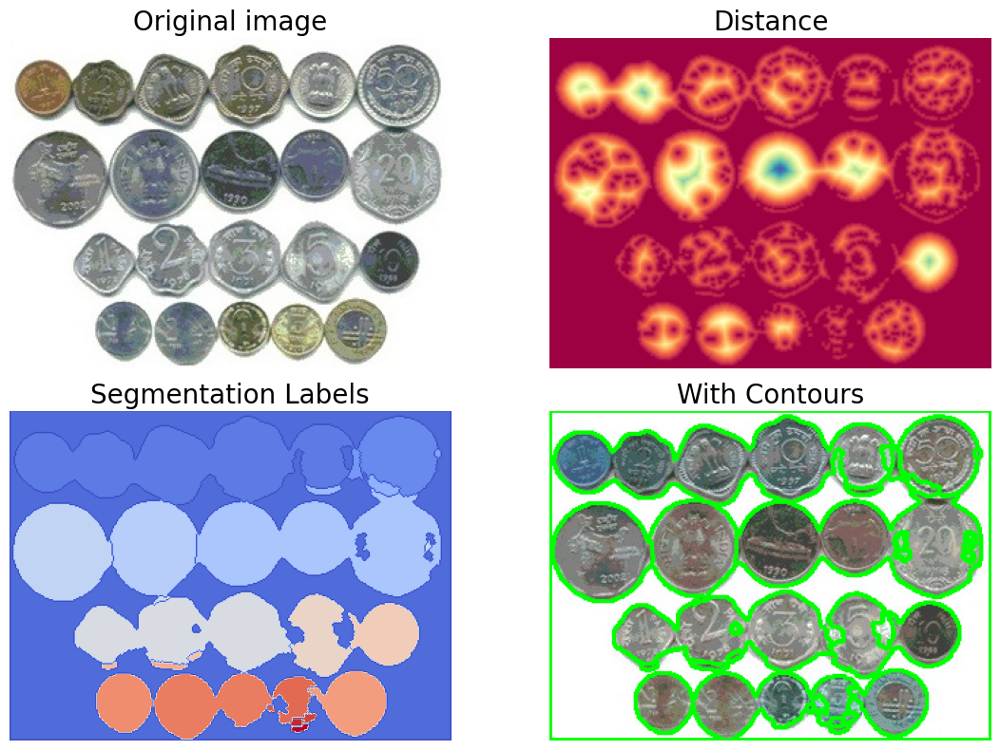

In [84]:
plt.figure(figsize=(12,8))
plt.subplot(221), plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Original image', size=20)
plt.subplot(222), plt.imshow(dist_transform, cmap='Spectral'), plt.axis('off'), plt.title('Distance', size=20)
plt.subplot(223), plt.imshow(markers, cmap='coolwarm'), plt.axis('off'), plt.title('Segmentation Labels', size=20)
plt.subplot(224), plt.imshow(image), plt.axis('off'), plt.title('With Contours', size=20)
plt.tight_layout()
plt.show()

### 5.2 Morphological Watershed with `SimpleITK`

In [26]:
import SimpleITK as sitk
import numpy as np
import matplotlib.pylab as plt

img = sitk.ReadImage('images/Img_03_05.jpg', sitk.sitkFloat64)
rescale = sitk.RescaleIntensityImageFilter()
rescale.SetOutputMaximum(1.0)
img = rescale.Execute(img)

In [27]:
feature_img = sitk.GradientMagnitude(img)
min_img = sitk.RegionalMinima(feature_img, backgroundValue=0, foregroundValue=1.0, fullyConnected=False, flatIsMinima=True)
marker_img = sitk.ConnectedComponent(min_img)
marker_img *= 0
marker_pts = {(10,10):1, (350,200):2, (500,300):1}
for pt, label in marker_pts.items():
    #idx = img.TransformPhysicalPointToIndex(pt)
    marker_img[pt] = label
ws = sitk.MorphologicalWatershedFromMarkers(feature_img, marker_img, markWatershedLine=True, fullyConnected=False)
labels = sitk.LabelToRGB(ws)
overlay = sitk.LabelOverlay(img, ws, opacity=0.001)
labels = rescale.Execute(labels)
overlay = rescale.Execute(overlay)

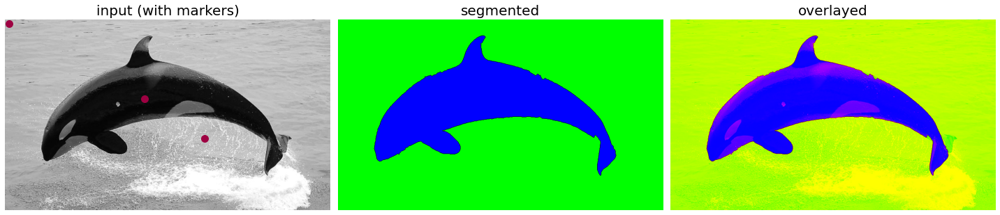

In [28]:
plt.figure(figsize=(20,10))
plt.subplot(131), plt.imshow(sitk.GetArrayFromImage(img), cmap='gray'), plt.axis('off')
for pt, label in marker_pts.items():
    plt.scatter(pt[0], pt[1], c=label, s=100, cmap='Spectral')
plt.title('input (with markers)', size=20)
plt.subplot(132), plt.imshow(255*sitk.GetArrayFromImage(labels)), plt.axis('off'), plt.title('segmented', size=20)
plt.subplot(133), plt.imshow(sitk.GetArrayFromImage(overlay)), plt.axis('off'), plt.title('overlayed', size=20)
plt.tight_layout()
plt.show()

### Problem 6: GrabCut Interactive Image Segmentation with `opencv-python`

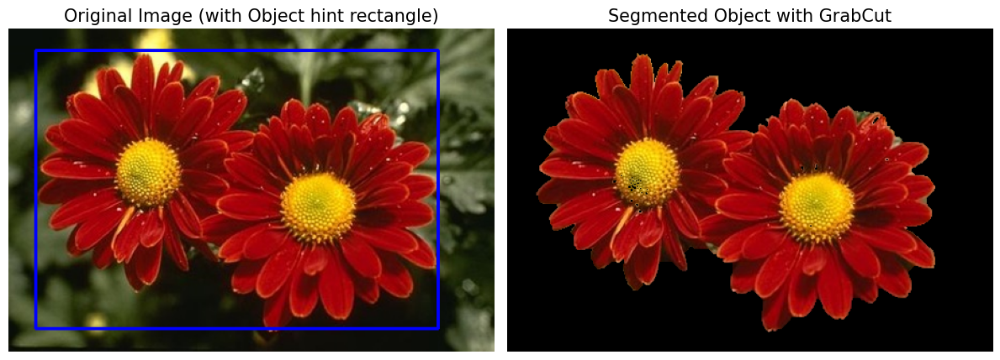

In [88]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

orig = cv2.imread('images/Img_03_06.png')
img = np.copy(orig)
mask = np.zeros(img.shape[:2],np.uint8)

# specify the rectangle around the object of interest (x, y, width, height)
rect = (25,20,400,280)
cv2.grabCut(img, mask, rect, None, None, 5, cv2.GC_INIT_WITH_RECT)

# Modify the mask to get the binary segmentation result
mask = np.where((mask==2)|(mask==0),0,1).astype('uint8')
# Apply the mask to the original image
img = img * mask[:,:,np.newaxis]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 7), sharex=True, sharey=True)
cv2.rectangle(orig, (rect[0], rect[1]), (rect[2], rect[3]), (255,0,0), 2)
ax1.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)), ax1.axis('off'), ax1.set_title('Original Image (with Object hint rectangle)', size=15)
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), ax2.axis('off'), ax2.set_title('Segmented Object with GrabCut', size=15) #,plt.colorbar()
plt.tight_layout()
plt.show()

### Problem 7: RandomWalk Segmentation with scikit-image

In [73]:
from skimage.segmentation import random_walker
from skimage.io import imread
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [74]:
img = imread('images/Img_03_07.png')[...,:3]
mask = imread('images/Img_mask_03_07.png')
markers = np.zeros(img.shape[:2], dtype=np.uint8)
markers[(mask[...,0] >= 200)&(mask[...,1] <= 20)&(mask[...,2] <= 20)] = 1
markers[(mask[...,0] <= 20)&(mask[...,1] >= 200)&(mask[...,2] <= 20)] = 2

# Run random walker algorithm
labels = random_walker(img, markers, beta=1, mode='bf', channel_axis=-1)
labels_prob = random_walker(img, markers, beta=9, mode='bf', channel_axis=-1, return_full_prob = True)

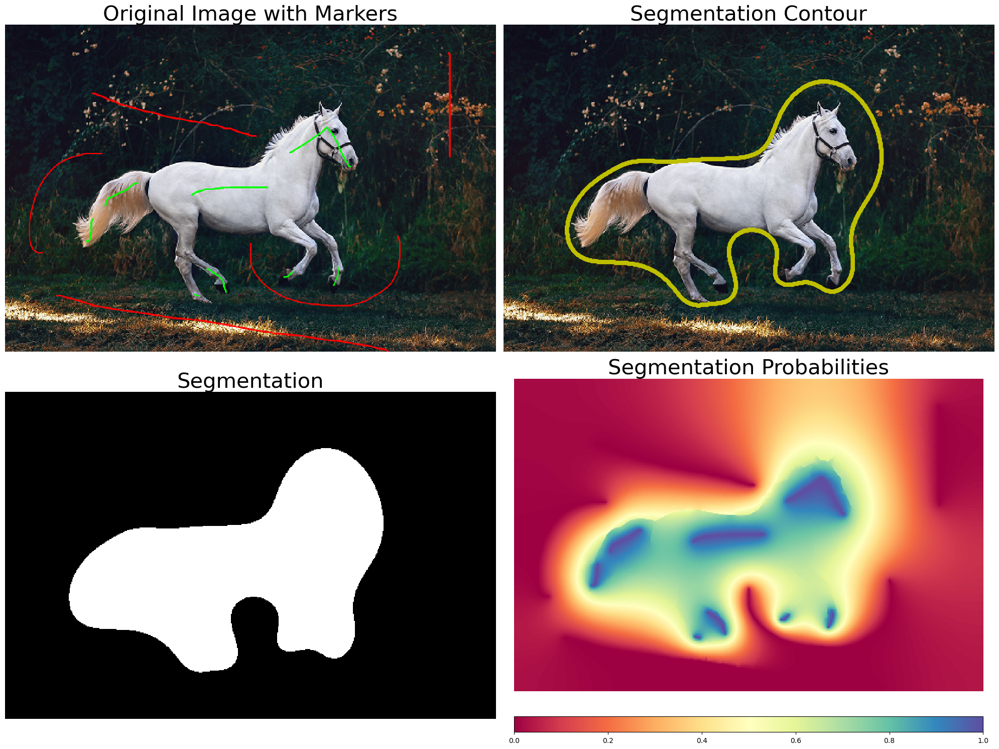

In [76]:
# Plot results
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 15), sharex=True, sharey=True)
ax1.imshow(mask, interpolation='nearest'), ax1.axis('off'), ax1.set_title('Original Image with Markers', size=30)
ax2.imshow(img, interpolation='nearest'), ax2.contour(labels, linewidths=5, colors='y'), ax2.axis('off')
ax2.set_title('Segmentation Contour', size=30)
ax3.imshow(labels, cmap='gray', interpolation='nearest'), ax3.axis('off')
ax3.set_title('Segmentation', size=30)
prob = ax4.imshow(labels_prob[1,...], cmap='Spectral', interpolation='nearest')
ax4.axis('off'), ax4.set_title('Segmentation Probabilities', size=30)
#fig.colorbar(prob, ax=ax4, shrink=0.7, aspect=30*0.7)
divider = make_axes_locatable(ax4)
cax = divider.new_vertical(size="5%", pad=0.5, pack_start=True)
fig.add_axes(cax)
fig.colorbar(prob, cax=cax, orientation="horizontal")
fig.tight_layout()
plt.show()

### Problem 8: Fast Marching image segmentation with SimpleITK

In [11]:
import SimpleITK as sitk
import numpy as np
import matplotlib.pylab as plt

seed_position = (70, 170)

sigma = 0.25
alpha = -3.0
beta = 10.0
stopping_time = 100

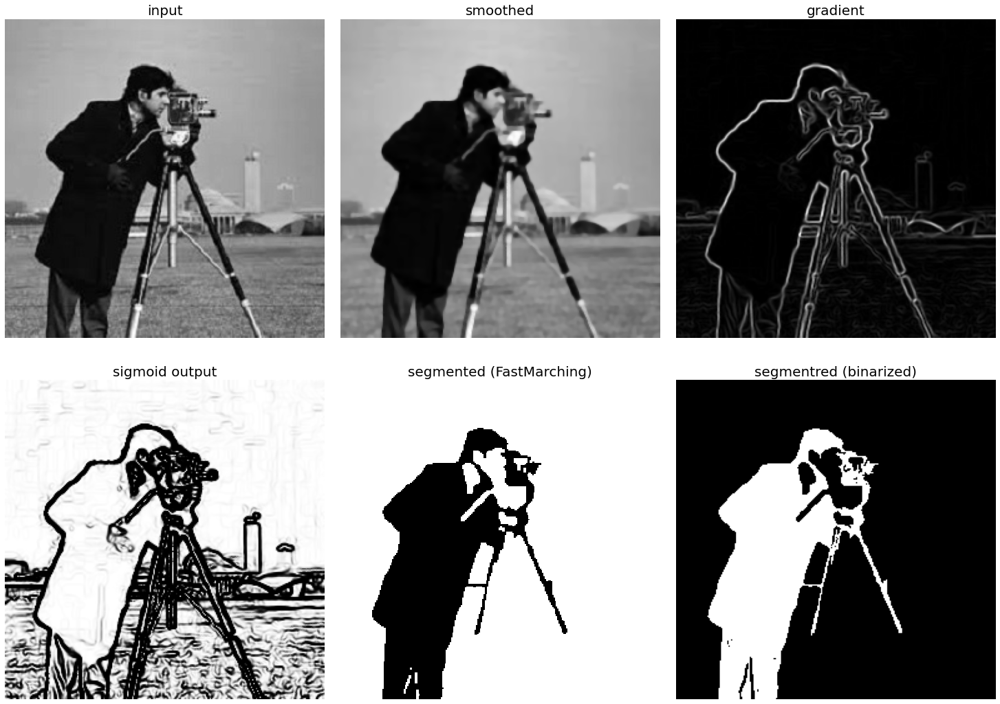

In [13]:
def plot_image(img, title, img_type=np.float32):
    im = sitk.GetArrayViewFromImage(img).astype(img_type)
    im = im / im.max()
    plt.imshow(im), plt.axis('off'), plt.title(title, size=20)


input_image = sitk.ReadImage('images/Img_03_09.png', sitk.sitkFloat32)

smoothing = sitk.CurvatureAnisotropicDiffusionImageFilter()
smoothing.SetTimeStep(0.125)
smoothing.SetNumberOfIterations(5)
smoothing.SetConductanceParameter(9.0)
smoothing_output = smoothing.Execute(input_image)

gradient_magnitude = sitk.GradientMagnitudeRecursiveGaussianImageFilter()
gradient_magnitude.SetSigma(sigma)
gradient_magnitude_output = gradient_magnitude.Execute(smoothing_output)
rescale = sitk.RescaleIntensityImageFilter()
gradient_magnitude_output = rescale.Execute(gradient_magnitude_output)

sigmoid = sitk.SigmoidImageFilter()
sigmoid.SetOutputMinimum(0.0)
sigmoid.SetOutputMaximum(255)
sigmoid.SetAlpha(alpha)
sigmoid.SetBeta(beta)
sigmoid_output = sigmoid.Execute(gradient_magnitude_output)

seed_value = 0
fast_marching = sitk.FastMarchingImageFilter()
trialPoint = (seed_position[0], seed_position[1], seed_value)
fast_marching.AddTrialPoint(trialPoint)
fast_marching.SetStoppingValue(stopping_time)
fast_marching_output = fast_marching.Execute(sigmoid_output)

thresholder = sitk.BinaryThresholdImageFilter()
thresholder.SetLowerThreshold(0)
thresholder.SetUpperThreshold(255)
thresholder.SetOutsideValue(0)
thresholder.SetInsideValue(1)
output_image = thresholder.Execute(fast_marching_output)

plt.figure(figsize=(20,15))
plt.gray()
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
plt.subplot(231), plot_image(input_image, 'input')
plt.subplot(232), plot_image(smoothing_output, 'smoothed')
plt.subplot(233), plot_image(gradient_magnitude_output, 'gradient', np.uint8)
plt.subplot(234), plot_image(sigmoid_output, 'sigmoid output')
plt.subplot(235), plot_image(fast_marching_output, 'segmented (FastMarching)')
plt.subplot(236), plot_image(output_image, 'segmentred (binarized)')
plt.show()

### Problem 9: Segmentation using SLIC and Normalized Cut  Algorithms with `scikit-image`

### 9.1 SLIC Segmentation

### 9.2 with Normalized Cut 


0.21.0


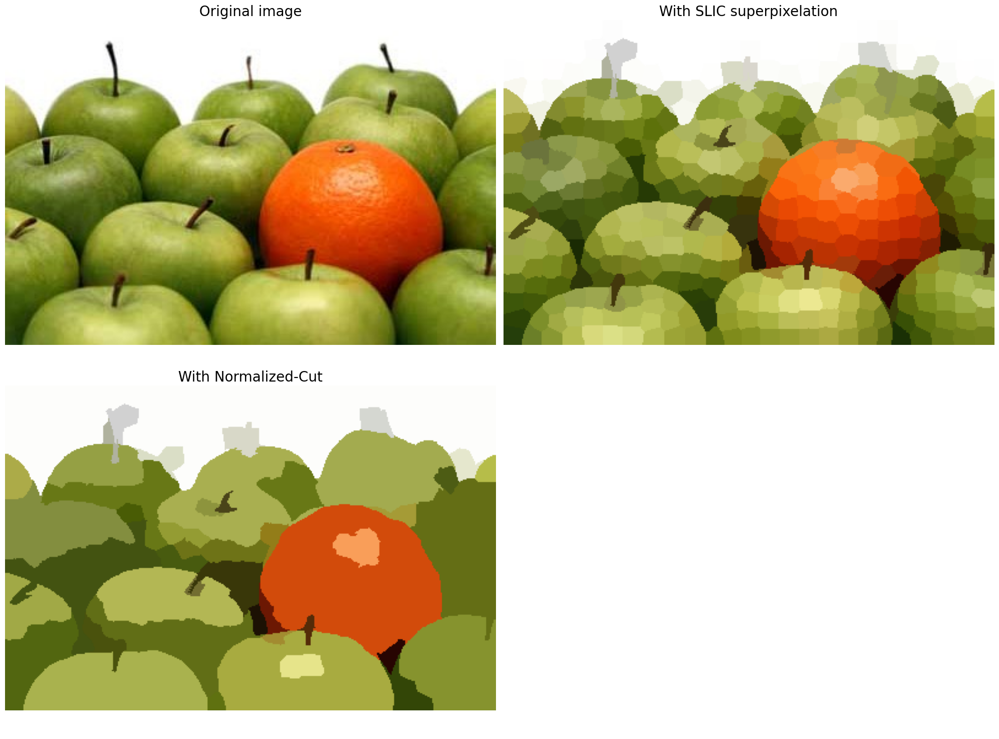

In [5]:
import skimage
print(skimage.__version__)
from skimage import graph, segmentation, color
from skimage.io import imread
from matplotlib import pyplot as plt

img = imread('images/Img_03_10.png')[...,:3]

labels_slic = segmentation.slic(img, compactness=30, n_segments=400)
out_slic = color.label2rgb(labels_slic, img, kind='avg')

g = graph.rag_mean_color(img, labels_slic, mode='similarity')
labels_ncut = graph.cut_normalized(labels_slic, g)
out_ncut = color.label2rgb(labels_ncut, img, kind='avg')

fig, ax = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, figsize=(20, 15))

ax[0,0].imshow(img), ax[0,0].set_title('Original image', size=20), ax[0,0].set_axis_off()
ax[0,1].imshow(out_slic), ax[0,1].set_title('With SLIC superpixelation', size=20), ax[1,0].set_axis_off()
ax[1,0].imshow(out_ncut), ax[1,0].set_title('With Normalized-Cut', size=20), ax[0,1].set_axis_off()
ax[1,1].set_axis_off()

plt.tight_layout()
plt.show()

### 9.3 with RAG Merging

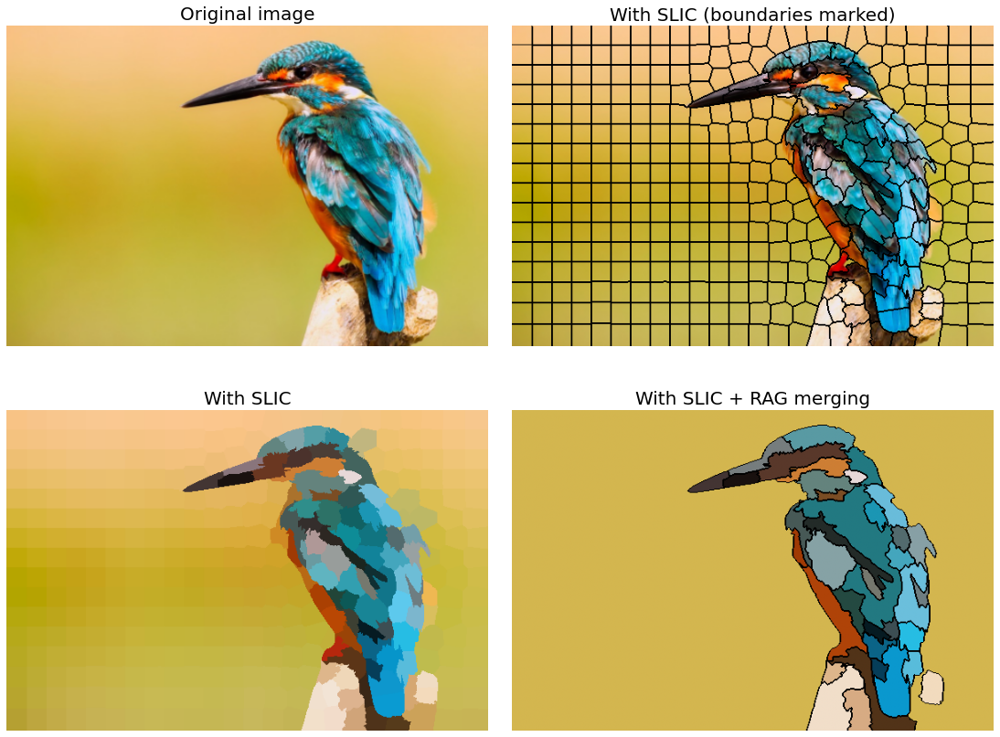

In [5]:
img = io.imread('images/Img_03_11.png')[...,:3]

labels_slic = segmentation.slic(img, compactness=30, n_segments=400)
out_slic = color.label2rgb(labels_slic, img, kind='avg')

g = graph.rag_mean_color(img, labels_slic)
labels_rag = graph.cut_threshold(labels_slic, g, 50)
out_rag = color.label2rgb(labels2, img, kind='avg')

fig, ax = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, figsize=(15, 12))
fig.subplots_adjust(0,0,1,0.95,0.05,0.05)
ax = ax.ravel()
ax[0].imshow(img), ax[0].set_title('Original image', size=20)
ax[1].imshow(segmentation.mark_boundaries(img, labels_slic, color=(0,0,0))), ax[1].set_title('With SLIC (boundaries marked)', size=20)
ax[2].imshow(out_slic), ax[2].set_title('With SLIC', size=20)
ax[3].imshow(segmentation.mark_boundaries(out_rag, labels_rag, color=(0,0,0))), ax[3].set_title('With SLIC + RAG merging', size=20)

for a in ax:
    a.axis('off')

plt.show()

## Questions

1. Use the `threshold_local()` function from `skimage.filters` module to obtain a local binary thresholded image (based on local pixel neighborhood) using a few different algorithms (e.g., `mean`, `median`, `niblack` etc.) with `camerman` input image from `skimage.data`. You should obtain a figure like the following one (with block size 25, e.g.): 

![](images/local_thresh.png)

   Vary the block size to see the impact on the output binary image obtained.

2. Use K-means clustering to group face images from LFW (Labeled Faces in the Wild) face dataset (from `scikit-learn`). If the face dataset contains faces of $7$ people, use $k=7$ clusters for kmeans. This time you need to treat each image as a vector and cluster them based on their feature representations. The following figure shows a few face samples from the face dataset.

![](images/faces.png)

   Use different algorithms to initialize the centroids for k-means (e.g., set `init` argument of the function `sklearn.KMeans()` to `random`, `k-means++`, `pca.components_` etc.) and observe how the metrics evaluating the cluster-quality varies. You should obtain a benchmarking result like the following table.

![](images/kmeans_res.png)

Finally, use a dimension reduction technique (e.g., PCA) to visualize the clusters in 2D. You should obtain a figure like the following ones (e.g., plot the images at the location given by the 2D coordinates corresponding to their low dimensional represntation).

![](images/kmeans_face.png)

Compare the (unsupervised) cluster labels with the ground-truths. How can we improve the quality of the clusters?

3. Use super-pixelation and the NCut algorithms to segment the same apples and orange image, but this time vary the input paramaters to the function `akimage.segmentation.slic()` and observe the impact on the segmented image. What values of the parameters will produce the following segmented images?

![](images/slic_ncut.png)

4. Segmentation using Active Contours with `SimpleITK`: Active Contour Models, also known as snakes, are a popular method for image segmentation. The basic idea is to evolve a curve within an image to find boundaries that separate different regions of interest. Use the function `GeodesicActiveContourLevelSetImageFilter()` from `SimpleITK` to implement active contour. For example, with the following input rose image you should obtain a segmented output like the following figure. 

![](images/ac_out.png)

5. Use `scipy.ndimage` to segment an image with connected component labeling (hint: use the funcion `label()`). Compute the area of the regions (e.g., use the function `np.bincount()`). Plot the regions obtained. For the following input image, you should obtain a figure like the following one:

![](images/connected.png)

Now, use `opencv-python`'s implementation for the same algorithm (e.g., use the function `cv2.connectedComponentsWithStats()`). Compare the results obtained from different library's implementations.

### References

1. https://openaccess.thecvf.com/content_cvpr_2017/papers/Chollet_Xception_Deep_Learning_CVPR_2017_paper.pdf
2. https://www.csd.uoc.gr/~tziritas/papers/segmentSpringer.pdf
3. https://www.iro.umontreal.ca/~mignotte/IFT6150/Articles/SLIC_Superpixels.pdf
4. https://dl.acm.org/doi/pdf/10.1145/1015706.1015720
5. https://people.eecs.berkeley.edu/~malik/papers/SM-ncut.pdf
6. http://vision.cse.psu.edu/people/chenpingY/paper/grady2006random.pdf
7. https://arxiv.org/pdf/1706.05587v3.pdf
8. https://www.youtube.com/watch?v=_HMyj_BIMoI
9. https://www.youtube.com/watch?v=DIODZIwwTK8
10. https://www.youtube.com/watch?v=seJ2jFvVGis
11. https://www.youtube.com/watch?v=PdAXkJObKGA 
12. https://arxiv.org/pdf/1610.02357.pdf
13. https://arxiv.org/abs/1606.02147
14. https://github.com/simogasp/opencv-semantic-segmentation/tree/master/enet-cityscapes